In [1]:
# import os
# import random

# # used to read data from database
# import mysql.connector
# import pymysql
# from mysql.connector import errorcode
# from sqlalchemy import create_engine

# used to store and manipulate data
import pandas as pd
import numpy as np

# files for plotting
import seaborn as sns
import matplotlib.pyplot as plt

# # used for plotting data
# from plotnine import *
# from plydata import *

# #for creating word clouds
# from collections import Counter
# import random
# from PIL import Image
# from wordcloud import WordCloud, ImageColorGenerator

# used for excluding weekends from plots involving dates
from pandas.tseries.offsets import BDay
isBusinessDay = BDay().is_on_offset
from datetime import datetime

# self created modules for reading sql files and running machine learning algorithms
from sql_db import sql_fun
from ml_analysis import analysis
from edtech_viz import visualize

# stop sql warning - pandas is working on fixing it
import warnings
warnings.filterwarnings("ignore")

The sql_fun function is from a self-made module created to access MySQL. It has functions to create tables, add data to tables and query a database.

In [2]:
# creates a database object to use with queries
host = "localhost"
user = "root"
password = "#Pandas&Penguins"
database = "learn"

s = sql_fun(host, user, password, database)

v = visualize()

#### Questions This Project Aims To Answer

* Do states with higher student achievement on the 2019 NAEP reading and math assessments have more online engagement in 2020?

* Is there a correlation between a states' technology plan/curriculum content and online engagement?

* Which products are used most in states with higher achievement rates on the 2019 NAEP reading and math assessments?

* Are any district technology development plan features correlated with achievement on the 2019 NAEP at grades 4, 8?

* Are any features of a school's culture correlated with more or less use of Edtech platforms?

* Which programs had the most engagement in each state?

* Is there an increase or a decrease in online product activity during online learning?

* What is the correlation between each demographic factor and engagement with online platforms?

Follow-up for later:  Are high levels of engagement with any particular programs correlated with high levels of achievement on the 2021 NAEP reading and math assessments?  

### Engagement Index or Percent Access?

The analysis below is designed to determine whether both engagement index and percent access should be used as indicators of online activity.

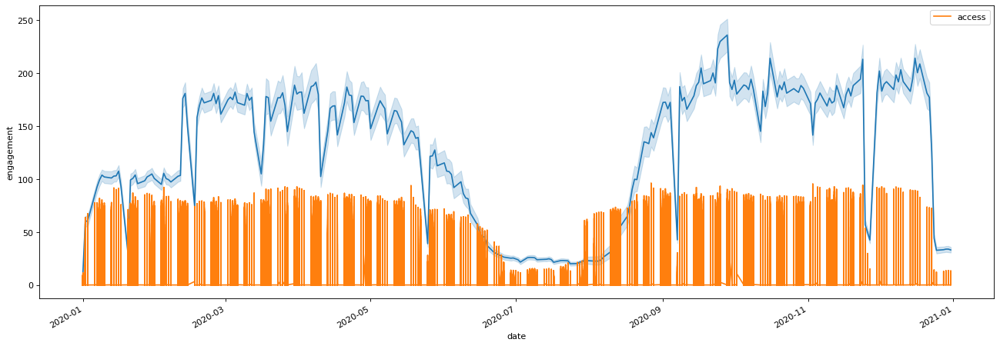

In [3]:
#look at how percent_access and engagement_index compare over time
access_engagement ='''SELECT 
                     date, 
                     percent_access AS access, 
                     engagement_index AS engagement
                 FROM 
                      product_access''' 

ae_df = s.query(access_engagement)

#exclude weekends from line plot
match_series = pd.to_datetime(ae_df['date']).map(isBusinessDay) 
ae_df_week = ae_df[match_series]
#ae_df_week = ae_df_week[['date', 'access', 'engagement']] 

fig, axes = plt.subplots(figsize = (20,7), dpi = 80)
l = sns.lineplot(data = ae_df_week, x = 'date', y = 'engagement') 
ae_df_week[['date','access']].plot(kind = "line", x='date', ax=l)
plt.legend(loc='best')
plt.show()

Although percent access is consistently lower than engagement access, they seem to follow the same pattern over time. With this knowledge, it was decided to use engagement access as the primary indicator of online activity rather than considering both variables. This will simplify the analysis but should still result in the same conclusions. The engagement index was chosen because it is slightly easier to see differences over time.

### How States Compare To The National Average on NAEP Assessments

In [4]:
# queries database for information related to states test scores, displays it

scores_query = '''SELECT state_districts as state, count(district_id) as count,
                        g4_math_all, g8_math_all, g4_read_all, g8_read_all
                   FROM assessments a
                   INNER JOIN districts d
                   ON d.state_districts = a.state_assessment
                   GROUP BY state_districts
                   HAVING count(district_id) > 5
                   ORDER BY g4_math_all desc;'''

scores_df = s.query(scores_query)

scores_df

,state,count,g4_math_all,g8_math_all,g4_read_all,g8_read_all
0,massachusetts,21,247,294,231,273
1,indiana,7,245,286,222,266
2,utah,29,244,285,225,267
3,connecticut,30,243,286,224,270
4,ohio,11,241,286,222,267
5,washington,6,240,286,220,266
6,missouri,6,238,281,218,263
7,illinois,18,237,283,218,265
8,new york,8,237,280,220,262
9,california,12,235,276,216,259


The test scores are from the 2019 NAEP (National Assessment of Educational Progress)'s Mathematics and Reading Assessments in Grades 4 and 8.

##### National Averages
* Grade 4 Math: 241
* Grade 8 Math: 282
* Grade 4 Reading: 220
* Grade 8 Reading: 263

The graphs below clearly show how states compared to the national average. Massachusetts outperforms all other states in the study in all four assessments. Massachusetts, Indiana, Utah, Connecticut and Ohio were at or above the national average. California was the only state below the national average in all four areas.

<Figure size 576x360 with 0 Axes>

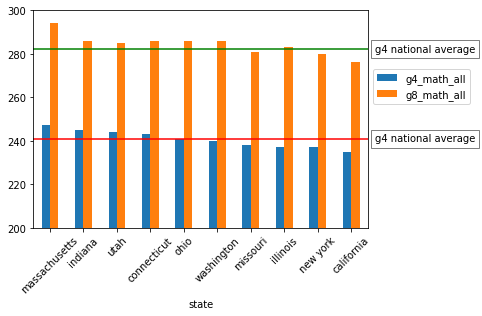

In [5]:
#plots bar graph of grade 4 and grade 8 math scores
ms = v.grade_bars(scores_df, "g4_math_all", "g8_math_all", 241, 282,
                "g4 national average", "g4 national average", 200, 300, .65)

<Figure size 576x360 with 0 Axes>

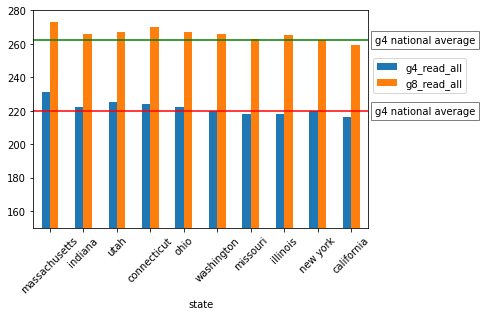

In [6]:
#plots bar graph of grade 4 and grade 8 reading scores
rs = v.grade_bars(scores_df, "g4_read_all", "g8_read_all", 220, 262,
                "g4 national average", "g4 national average", 150, 280, .7)

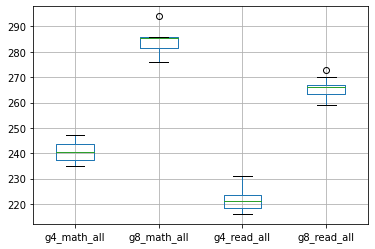

In [7]:
#create box plot of assessment scores to look for distribution and outliers
scores = scores_df.boxplot(column=['g4_math_all', 'g8_math_all', 'g4_read_all', 'g8_read_all'])

### Assessment Scores and Engagement
##### Explores the question:  
* Do states with higher student achievement on the 2019 NAEP reading and math assessments have more online engagement in 2020?

In [8]:
# creates dataframe with query for average engagement per district
product_query = '''SELECT
                    state_districts as state,
                    AVG(engagement_index) AS engage_average
                   FROM
                    product_access a
                   INNER JOIN districts d
                   ON d.district_id = a.district_id
                   GROUP BY
                    d.state_districts'''
products = s.query(product_query)

#creates dataframe with query for test scores, sorts them by g4 scores 

# creates dataframe with engagement avearge by state and state scores
state_tests = products.merge(scores_df) 

Mean Absolute Error: 104.620
Squared Error: 137.517
Coefficient of determination: -0.066


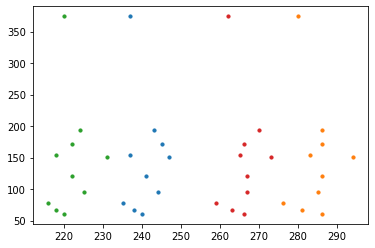

In [9]:
# use linear regression to look for a correlation between average engagement and test scores
t = analysis(state_tests[['g4_math_all', 'g8_math_all', 'g4_read_all', 'g8_read_all']], state_tests['engage_average'])
t.linear_regression()

#### Analysis of Linear Regression

There is a slight negative association between online engagement and test scores. However, there is a possibility that particular platforms are linked to positive achievement, and others are linked to negative achievement.

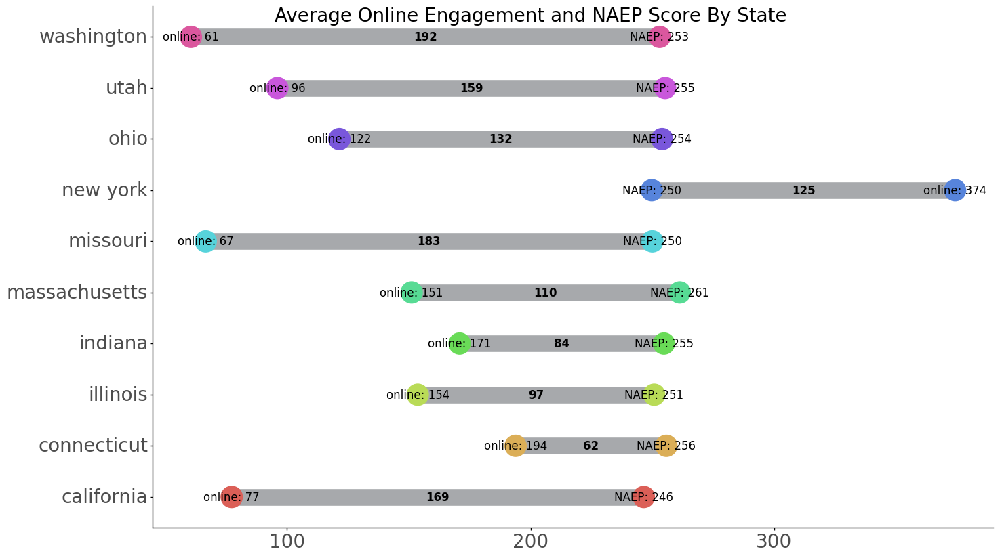

In [10]:
v.segment_plot(state_tests)

There is no clear link between the average amount of engagement in a state and student performance on the NAEP assessment in 2019. It is apparent from the graphic below that states with higher test scores do not necessarily have more online engagement. It will be interesting to see if this hold true when the next NAEP assessment is given.

In [11]:
test_corr = state_tests[['engage_average', 'g4_math_all', 'g8_math_all', 'g4_read_all', 'g8_read_all']]
test_corr = test_corr.corr()
print(test_corr['engage_average'])

engage_average    1.000000
g4_math_all      -0.039471
g8_math_all      -0.052313
g4_read_all       0.113620
g8_read_all      -0.014472
Name: engage_average, dtype: float64


There is a slightly negative overall correlation (with a very high error rate) between the amount of engagement with Edtech and assessments. However, there is a postive correlation between the Grade 4 reading assessments and increased engagement of digital engagement platforms. This is similar to what Falck et al. found in their research. They discovered that technology had a different effect on students by grade level and subject (although they looked at math and science).

<div class="csl-entry">Falck, O., Mang, C., Woessmann, L. (2018). Virtually No Effect? Different Uses of Classroom Computers and their Effect on Student Achievement. <i>Oxford Bulletin of Economics and Statistics</i>, <i>80</i>(1), 1–38. https://doi.org/10.1111/obes.12192</div>

In [12]:
# query to explore product use against different features
product_use_query =   '''SELECT 
                 d.district_id as district,
                 state_districts as state, 
                 a.product_id,
                 date,
                 engagement_index AS engagement,
                 name
               FROM 
                  districts d
               JOIN 
                  product_access a 
               ON d.district_id = a.district_id
               JOIN products p
               ON a.product_id = p.product_id''' 

product_use_df = s.query(product_use_query)

In [13]:
# merge scores and products to explore correlation between products and scores
# also used to explore products used in different states
engagement_scores_df = scores_df.merge(product_use_df)

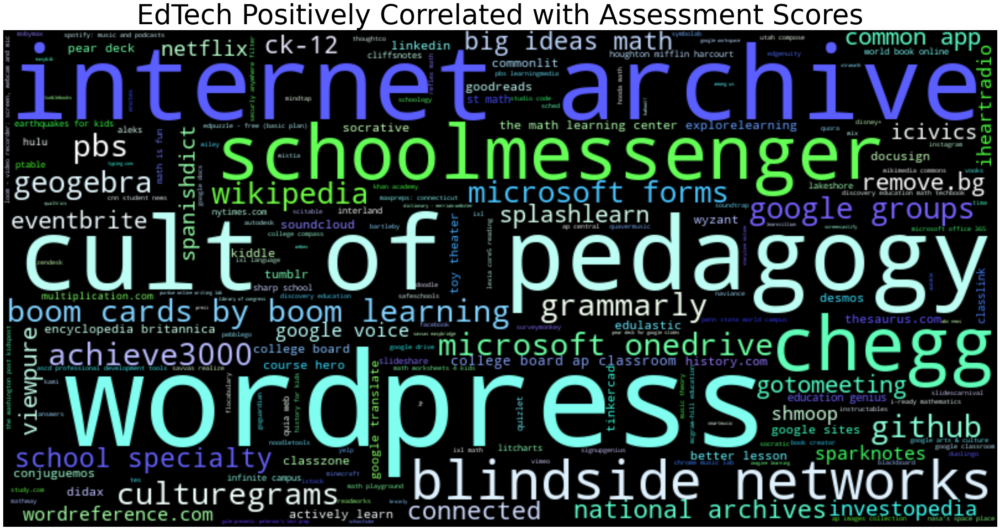

In [14]:
# calculate average of test scores at each level
engagement_scores_df['test_ave'] = (engagement_scores_df['g4_math_all'] + engagement_scores_df['g8_math_all'] + 
                                    engagement_scores_df['g4_read_all'] + engagement_scores_df['g8_read_all'])/4


# create table with average as rows and products for columns, engagement index for each state/product as values
districts_df = engagement_scores_df.groupby(['state', 'name', 'test_ave'])['engagement'].mean().reset_index()
districts_df = districts_df.fillna(0)
districts_df = districts_df.pivot(index = 'test_ave', columns = 'name', values = 'engagement').reset_index()

# look at correlation between average test scores and different products
corr = districts_df.corr()
corr_sorted = corr.sort_values(by=['test_ave'], ascending = False).reset_index()
corr_sorted = corr_sorted[['name', 'test_ave']]
corr_sorted = corr_sorted.loc[corr_sorted['name'] != 'test_ave']
corr_sorted_pos = corr_sorted.loc[corr_sorted['test_ave'] > 0]

# create a word cloud showing products positively correlated with average assessment scores
pos_dict = corr_sorted_pos.set_index('name')['test_ave'].to_dict()
v.make_cloud_dict(pos_dict, "EdTech Positively Correlated with Assessment Scores")

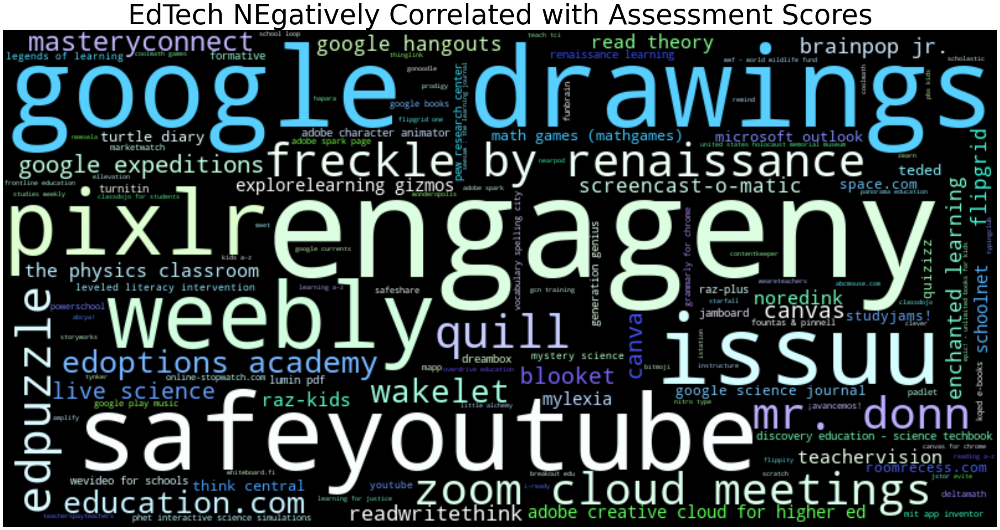

In [15]:
# create word cloud of products negatively associated with assessment scores
corr_sorted_neg = corr_sorted.loc[corr_sorted['test_ave'] < 0]
neg_dict = corr_sorted_neg.set_index('name')['test_ave'].to_dict()
v.make_cloud_dict(neg_dict, "EdTech NEgatively Correlated with Assessment Scores")

In [16]:
pos_list = list(corr_sorted_pos['name'])
pos_list

['wordpress',
 'internet archive',
 'cult of pedagogy',
 'schoolmessenger',
 'chegg',
 'blindside networks',
 'boom cards by boom learning',
 'achieve3000',
 'pbs',
 'github',
 'culturegrams',
 'grammarly',
 'microsoft onedrive',
 'google groups',
 'wikipedia',
 'microsoft forms',
 'geogebra',
 'school specialty',
 'connected',
 'big ideas math',
 'national archives',
 'ck-12',
 'eventbrite',
 'gotomeeting',
 'splashlearn',
 'viewpure',
 'remove.bg',
 'common app',
 'investopedia',
 'netflix',
 'spanishdict',
 'icivics',
 'sparknotes',
 'iheartradio',
 'shmoop',
 'google voice',
 'wordreference.com',
 'college board ap classroom',
 'encyclopedia britannica',
 'thesaurus.com',
 'socrative',
 'conjuguemos',
 'google translate',
 'kiddle',
 'explorelearning',
 'college board',
 'course hero',
 'tinkercad',
 'soundcloud',
 'history.com',
 'docusign',
 'didax',
 'better lesson',
 'the math learning center',
 'wyzant',
 'edulastic',
 'linkedin',
 'toy theater',
 'classzone',
 'actively learn

In [17]:
neg_list = list(corr_sorted_neg['name'])
neg_list

['safeyoutube',
 'google drawings',
 'engageny',
 'weebly',
 'pixlr',
 'issuu',
 'freckle by renaissance',
 'zoom cloud meetings',
 'mr. donn',
 'quill',
 'edpuzzle',
 'edoptions academy',
 'education.com',
 'wakelet',
 'masteryconnect',
 'google expeditions',
 'the physics classroom',
 'noredink',
 'read theory',
 'teachervision',
 'google hangouts',
 'enchanted learning',
 'screencast-o-matic',
 'brainpop jr.',
 'readwritethink',
 'live science',
 'canva',
 'blooket',
 'canvas',
 'adobe creative cloud for higher ed',
 'schoolnet',
 'mylexia',
 'explorelearning gizmos',
 'raz-kids',
 'flipgrid',
 'math games (mathgames)',
 'teded',
 'think central',
 'turtle diary',
 'microsoft outlook',
 'google science journal',
 'space.com',
 'roomrecess.com',
 'quizizz',
 'studyjams!',
 'discovery education - science techbook',
 'lumin pdf',
 'dreambox',
 'generation genius',
 'raz-plus',
 'wevideo for schools',
 'pew research center',
 'jamboard',
 'renaissance learning',
 'formative',
 'turnitin

There was a positive correlation between some EdTech tools and assessment scores and a negative correlation between other tools and assessment scores. I looked over the different platforms in each category to see if I could distinguish factors that might differentiate between the two. I was not familiar with all of the platforms, so I probably missed some insights. However, I noticed that many of the programs positively correlated with achievement had one of these characteristics:

* used for research
* used for teacher professional development
* used to share or improve writing
* used for collaboration
* make math interactive or relate it to real-contexts
* websites for educational publishing companies
* make whole class lessons more interactive by playing games that formatively assess understanding during the lesson

Many of those that were negatively associated with achievement shared these characteristics:

* aimed towards elementary students
* replicated worksheets in game form (rote learning, but gamified)
* used for remediation when students were struggling
* involved reading books digitally
* used for behavior management
* provided worksheets for teachers to print and use with students

However, it should not be assumed that correlation implies causation. For example, schools with limited resources might use digital books more often to expand their students' access to different types of books. Teachers might use worksheet websites because their school lacks an explicit curriculum or materials for students to practice what they learn. Both indicate a lack of resources, which could mean the teachers don't have everything they need to provide the best quality education for students. This might be the actual cause for lower achievement. If this were the case, simply using those resources correlated with positive achievement in this analysis would likely not impact student achievement.

Several research studies have been done about the impact of technology use in on student achievement. This analysis supports what many have found: some types of Edtech support student achievement better than others. However, the lists created by this analysis should not form the basis of decisions on which digital media to use in a classroom. On the other hand, this analysis could provide a reason to look more carefully at how technology is used in education.

### Achievement and Product Use

##### Answers the questions:

* Which products are used most in states with higher achievement rates on the 2019 NAEP reading and math assessments?

In [18]:
covid_df = engagement_scores_df[['state','g4_math_all', 'g8_math_all', 'g4_read_all',
       'g8_read_all', 'engagement', 'name', 'date', 'test_ave']]

covid_string = "2020-03-15"
covid = datetime.fromisoformat(covid_string)
before_covid = covid_df.loc[covid_df['date'] < covid].reset_index(drop=True)
after_covid = covid_df.loc[covid_df['date'] > covid].reset_index(drop=True)

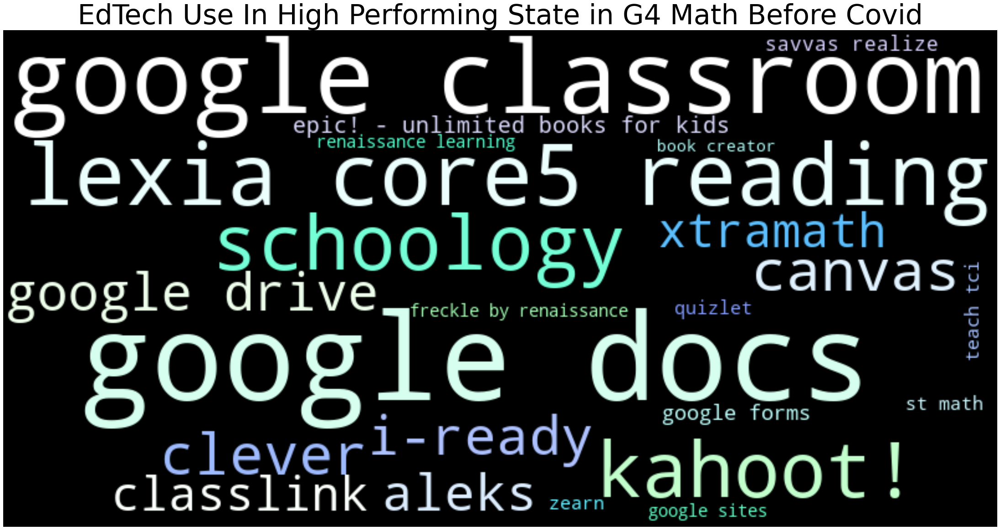

In [19]:
g4_math_nat_ave = 241
before_covid['g4_math_level'] =  np.where(before_covid['g4_math_all'] >= g4_math_nat_ave, 'high', 'low')
v.high_scores(before_covid, 'g4_math_level', 'EdTech Use In High Performing State in G4 Math Before Covid')

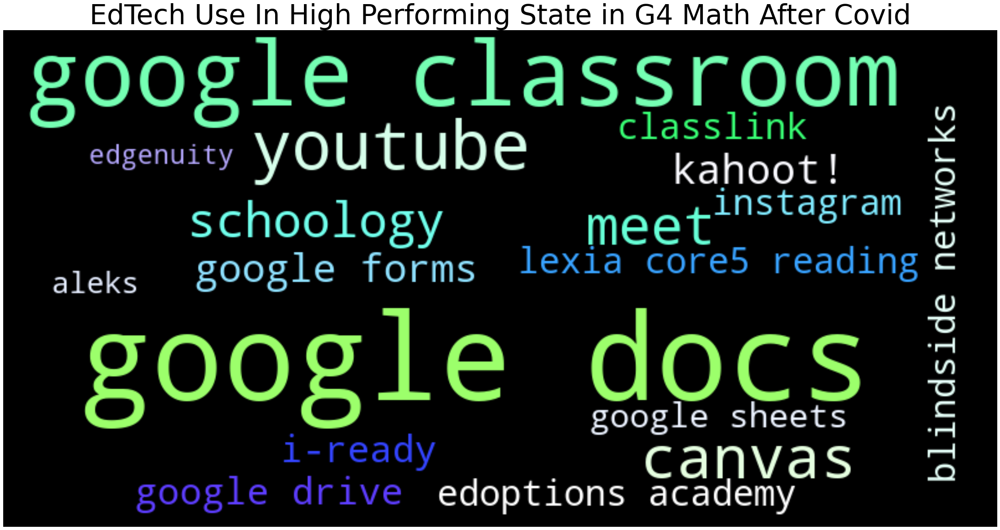

In [20]:
after_covid['g4_math_level'] =  np.where(after_covid['g4_math_all'] >= g4_math_nat_ave, 'high', 'low')
v.high_scores(after_covid, 'g4_math_level', 'EdTech Use In High Performing State in G4 Math After Covid')

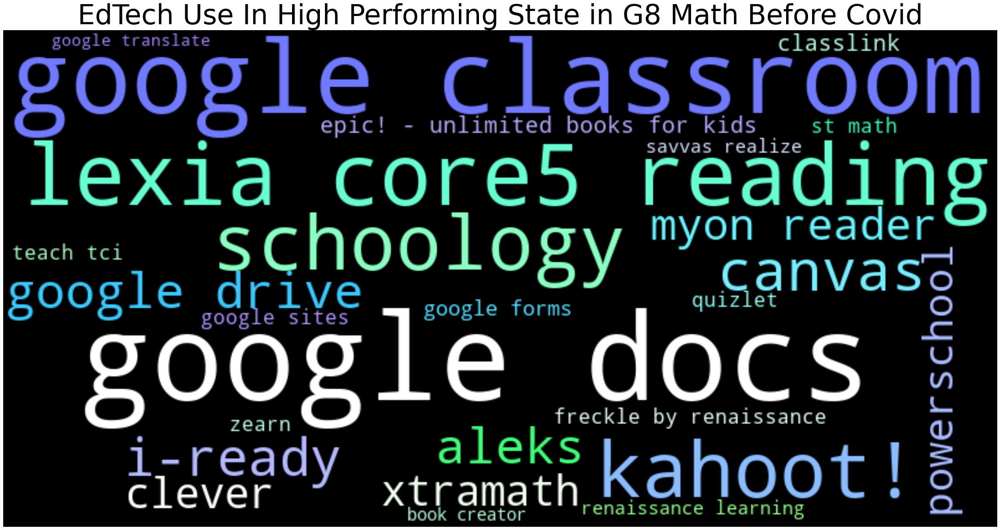

In [21]:
g8_math_nat_ave = 282
before_covid['g8_math_level'] =  np.where(before_covid['g8_math_all'] >= g8_math_nat_ave, 'high', 'low')
v.high_scores(before_covid, 'g8_math_level', 'EdTech Use In High Performing State in G8 Math Before Covid')

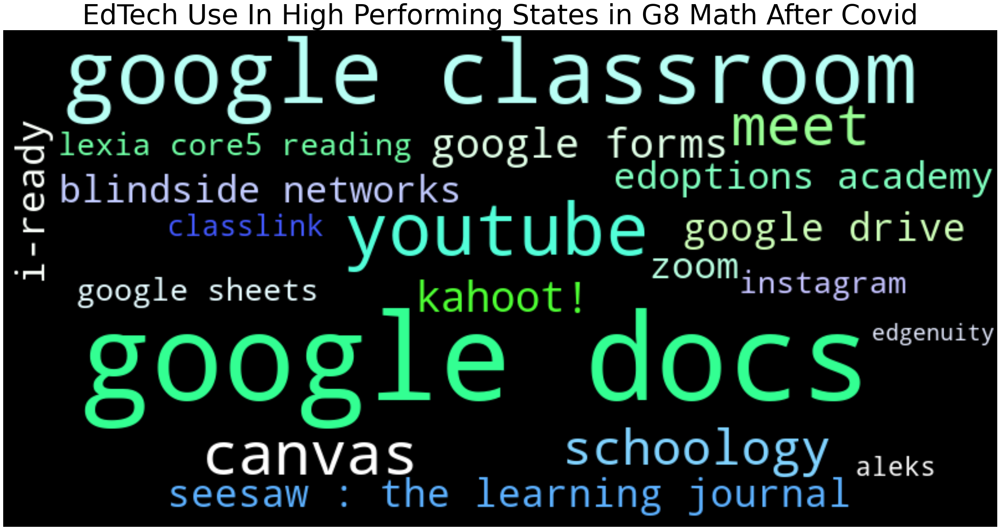

In [22]:
g8_math_nat_ave = 282
after_covid['g8_math_level'] =  np.where(after_covid['g8_math_all'] >= g8_math_nat_ave, 'high', 'low')
v.high_scores(after_covid, 'g8_math_level', 'EdTech Use In High Performing States in G8 Math After Covid')

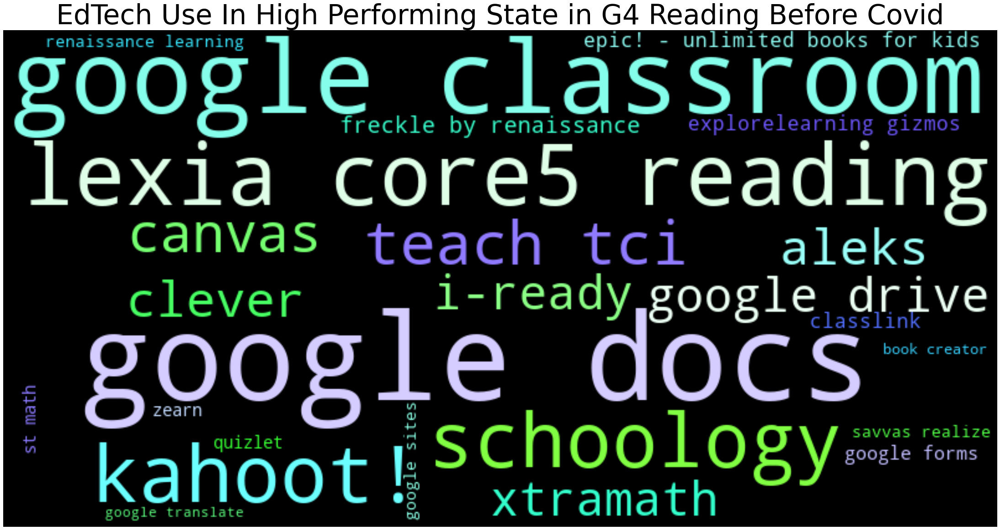

In [23]:
g4_read_nat_ave = 220
before_covid['g4_read_level'] =  np.where(before_covid['g4_read_all'] >= g4_read_nat_ave, 'high', 'low')
v.high_scores(before_covid, 'g4_read_level', 'EdTech Use In High Performing State in G4 Reading Before Covid')

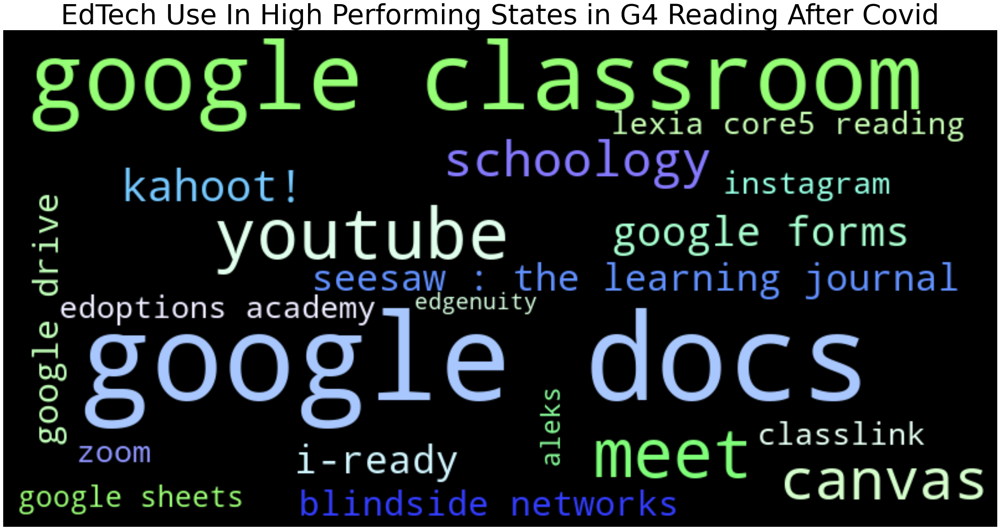

In [24]:
g4_read_nat_ave = 220
after_covid['g4_read_level'] =  np.where(after_covid['g4_read_all'] >= g4_read_nat_ave, 'high', 'low')
v.high_scores(after_covid, 'g4_read_level', 'EdTech Use In High Performing States in G4 Reading After Covid')

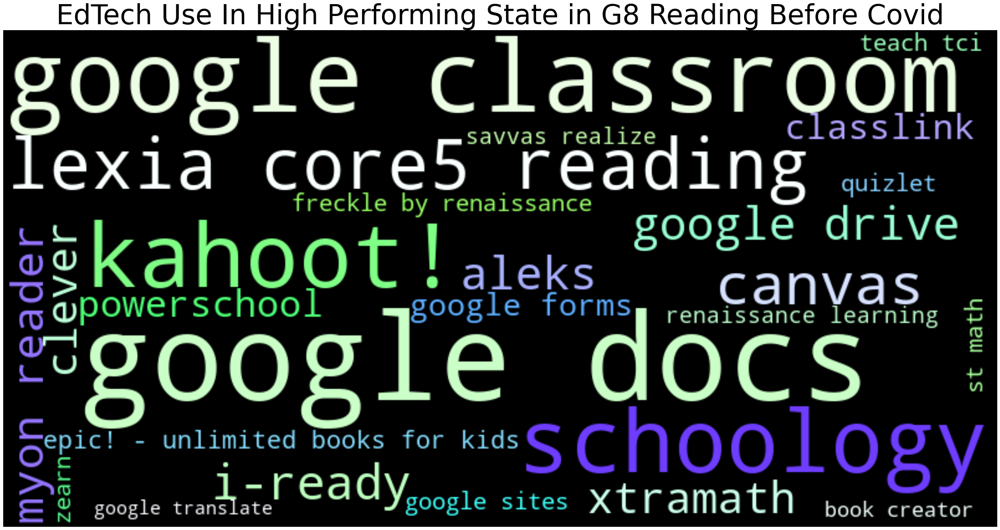

In [25]:
g8_read_nat_ave = 263
before_covid['g8_read_level'] =  np.where(before_covid['g8_read_all'] >= g8_read_nat_ave, 'high', 'low')
v.high_scores(before_covid, 'g8_read_level', 'EdTech Use In High Performing State in G8 Reading Before Covid')

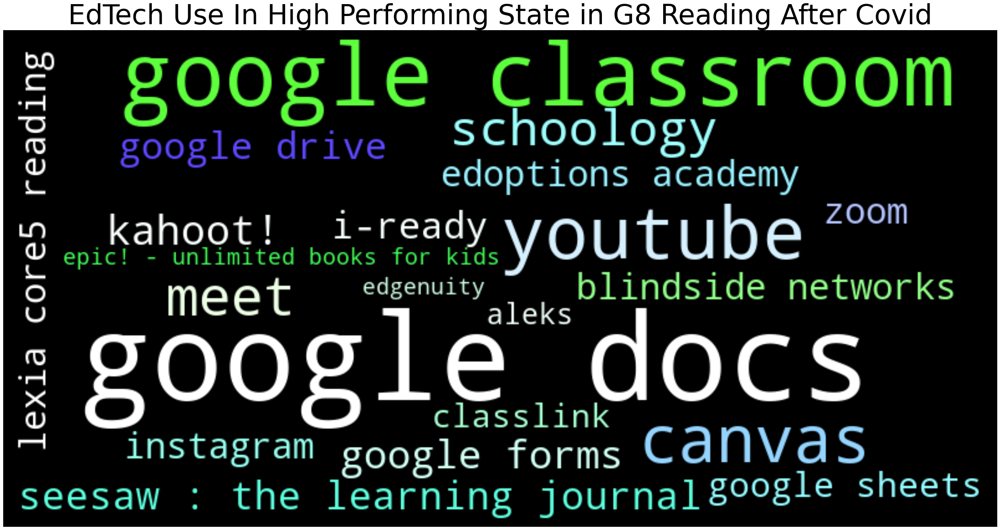

In [26]:
g8_read_nat_ave = 263
after_covid['g8_read_level'] =  np.where(after_covid['g8_read_all'] >= g8_read_nat_ave, 'high', 'low')
v.high_scores(after_covid, 'g8_read_level', 'EdTech Use In High Performing State in G8 Reading After Covid')

In [27]:
high_products = [] 

high_products.append(v.high_not_low(engagement_scores_df, 'g4_math_all', 241))
high_products.append(v.high_not_low(engagement_scores_df, 'g8_math_all', 282))
high_products.append(v.high_not_low(engagement_scores_df, 'g4_read_all', 220))
high_products.append(v.high_not_low(engagement_scores_df, 'g8_read_all', 263))

high_products

['aleks lexia core5 reading st math big ideas math',
 'freckle by renaissance classlink google sites',
 'aleks lexia core5 reading st math big ideas math',
 'freckle by renaissance classlink google sites']

The word clouds make it apparent that there were some changes in which EdTech was used after schools were affected by Covid. There is a reduction in the range of platforms used. There are also some new platforms used after Covid that were not used before Covid. Except for greater use of Learning Management Systems, there are no apparent differences in the types of programs chosen. For example, there is no increase or decrease in the usage of platforms for practicing skills or allowing students to creatively share learning.

### Technology Plans and Engagement
##### Answers the questions:  
* Is there a correlation between a states' technology plan/curriculum content and online engagement?
* Are any district technology development plan features correlated with achievement on the 2019 NAEP at grades 4, 8?
* Which technology plan features are associated with high or low online engagement?
* Which technology plan features are associated with high or low student achievement?

The analysis below looks at the correlation between a state's technology plans and the amount of online engagement. It also looks at which elements of states' technology plans correlate with higher and lower test scores. First, linear regression is run to look at correlation. 

Looking at specific features of technology plans associated with high or low engagement and achievement was not part of the original plan for the study. However, this information is likely to be more informative than merely knowing if there is a correlation. So association rules mining was performed to find items associated with high and low engagement or scores. Then a word cloud was created to create a visual representation of factors related to different outcomes.

In [28]:
plan_query = '''SELECT
                   *
                FROM
                  tech_plans
                '''

techplans = s.query(plan_query)
techplans.rename(columns = {'state_tech': 'state'}, inplace = True)

# combine the tech plans data with the data for average use and test scores for a state
tech_engage = state_tests.merge(techplans)

# columns for use in correlation analysis below
engage_correlation_columns = ['engage_average','year', '21st_century', 'address_gaps', 'authentic',
       'stud_collaborate', 'comp_sci_ed', 'data_driven', 'data_protect',
       'digital_citizenfl', 'local_control', 'equity', 'flexible',
       'for_assess', 'goals', 'home_access', 'integration', 'investment',
       'one_to_one', 'pd', 'personal_learn', 'privacy', 'problem_solving',
       'learning_communities', 'shared_resources', 'standards',
       'student_centered', 'tech_leader', 'tech_lit', 'statewide_goals',
       'as_learning_tool', 'data_manage', 'tech_assist', 'college', 'careers',
       'consultant', 'teach_libr', 'teacher_collab', 'form_assess',
       'common_core']

test_correlation_columns = ['test_ave','year', '21st_century', 'address_gaps', 'authentic',
       'stud_collaborate', 'comp_sci_ed', 'data_driven', 'data_protect',
       'digital_citizenfl', 'local_control', 'equity', 'flexible',
       'for_assess', 'goals', 'home_access', 'integration', 'investment',
       'one_to_one', 'pd', 'personal_learn', 'privacy', 'problem_solving',
       'learning_communities', 'shared_resources', 'standards',
       'student_centered', 'tech_leader', 'tech_lit', 'statewide_goals',
       'as_learning_tool', 'data_manage', 'tech_assist', 'college', 'careers',
       'consultant', 'teach_libr', 'teacher_collab', 'form_assess',
       'common_core']

# normalize year value
tech_engage['year'] = (tech_engage['year'] - np.min(tech_engage['year'])) / (np.max(tech_engage['year']) - np.min(tech_engage['year']))

Mean Absolute Error: 0.006
Squared Error: 0.007
Coefficient of determination: 1.000


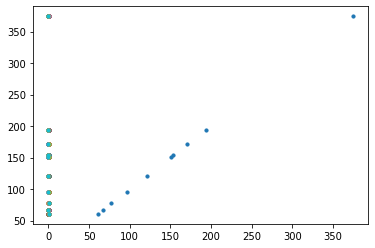

In [29]:
tech_lin = analysis(tech_engage[engage_correlation_columns], tech_engage['engage_average'])
tech_lin.linear_regression()

In [30]:
# prepare data for word cloud to show tech plan factors associated with high and low online engagement
# word clouds will be shown below

# columns to drop after processing data for engagement word clouds
columns = ['level', 'state', 'engage_average', 'test_ave',
           'count',  'g4_math_all', 'g8_math_all', 'g4_read_all', 'g8_read_all', 
           'index', 'test_ave', 'average_engagement', 'gap', 'label', 'year']

tech_df = v.association_prepare(tech_engage, 'engage_average', columns)

#create an analysis object and perform association rules mining on data
tech_analysis = analysis()
rules = tech_analysis.association_apriori(tech_df, support = 0.05)

engage_high, high_engage, engage_low, low_engage = v.sort_rules(rules)


# columns to drop after processing for testing word clouds
columns = ['level', 'state', 'test_ave', 'engage_average',
           'count',  'g4_math_all', 'g8_math_all', 'g4_read_all', 'g8_read_all', 
           'index', 'test_ave', 'average_engagement', 'gap', 'label', 'year']

tech_df = v.association_prepare(tech_engage, 'test_ave', columns)

#create an analysis object and perform association rules mining on data
tech_analysis = analysis()
rules = tech_analysis.association_apriori(tech_df, support = 0.05)

engage_high, high_test, engage_low, low_test= v.sort_rules(rules)

In [31]:
plans_engage = tech_engage[engage_correlation_columns].corr()
plans_engage = plans_engage[['engage_average']]
plans_engage_pos = plans_engage.loc[plans_engage['engage_average'] > 0]
plans_engage_pos

,engage_average
engage_average,1.000000
21st_century,0.201504
address_gaps,0.074311
data_driven,0.229227
local_control,0.092391
goals,0.250643
investment,0.124181
shared_resources,0.289773
tech_leader,0.003103
tech_lit,0.293218


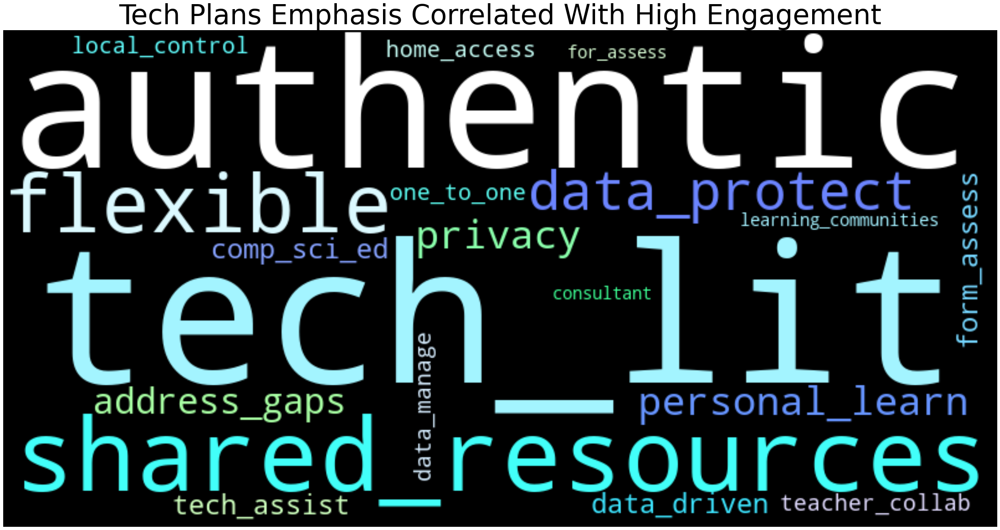

In [32]:
v.make_cloud_list(high_engage, 'Tech Plans Emphasis Correlated With High Engagement')

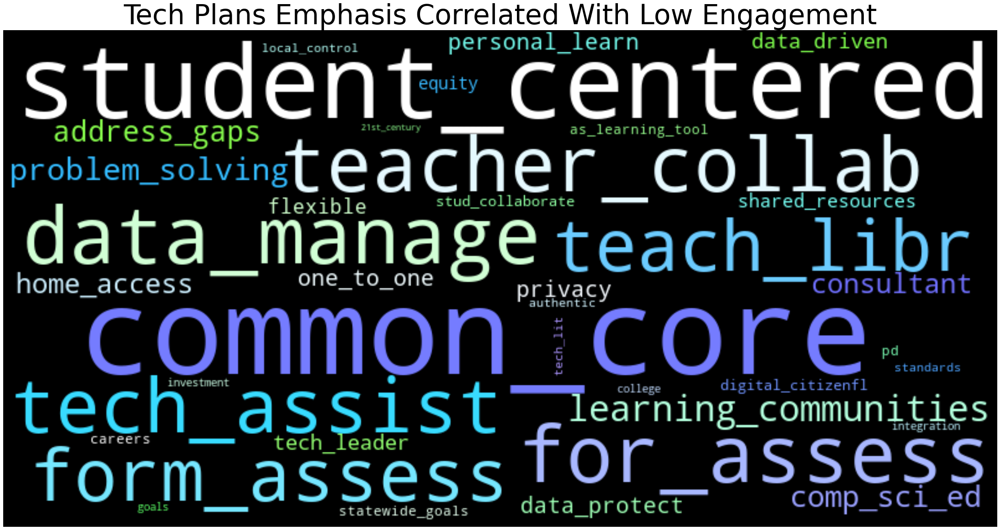

In [33]:
v.make_cloud_list(low_engage, 'Tech Plans Emphasis Correlated With Low Engagement')

In [34]:
plans_engage_neg = plans_engage.loc[plans_engage['engage_average'] < 0]
plans_engage_neg 

,engage_average
year,-0.219342
authentic,-0.185499
stud_collaborate,-0.511697
comp_sci_ed,-0.360882
data_protect,-0.152792
digital_citizenfl,-0.746471
equity,-0.540092
flexible,-0.252394
for_assess,-0.463804
home_access,-0.112702


Linear regression shows a high correlation between the focus of technology plans and online engagement. However, there was a considerable error, meaning the correlation was not valid. For this reason, it was decided to look more closely and see if any features of technology plans were positively or negatively correlated with engagement. It turns out that there were a few highly correlated features and many more that were negatively correlated. Many of those positively correlated with increased technology use have to do with supporting teachers in using technology in learning. Goals, statewide_goals, investment, shared_resources, tech_leader, tech_lit, consultant, teach_libr all support teachers using technology. They do this by ensuring teachers know what is expected (goals) or have the resources they need (investment, shared resources). Additionally, they are related to supporting teachers in learning how to effectively use technology. 21st_century, as_learning_tool, address_gaps, explicitly state appropriate reasons for using EdTech.

Mean Absolute Error: 0.227
Squared Error: 0.308
Coefficient of determination: 0.999


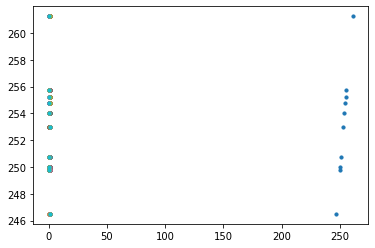

In [35]:
tech_achieve = analysis(tech_engage[test_correlation_columns], tech_engage['test_ave'])
tech_achieve.linear_regression()

In [36]:
plans_test = tech_engage[test_correlation_columns].corr()
plans_test = plans_test[['test_ave']]
plans_test_pos = plans_test.loc[plans_test['test_ave'] > 0]
plans_test_pos

,test_ave
test_ave,1.000000
year,0.252228
21st_century,0.030833
authentic,0.319538
stud_collaborate,0.112743
flexible,0.070792
integration,0.152072
problem_solving,0.073414
standards,0.044957
student_centered,0.131659


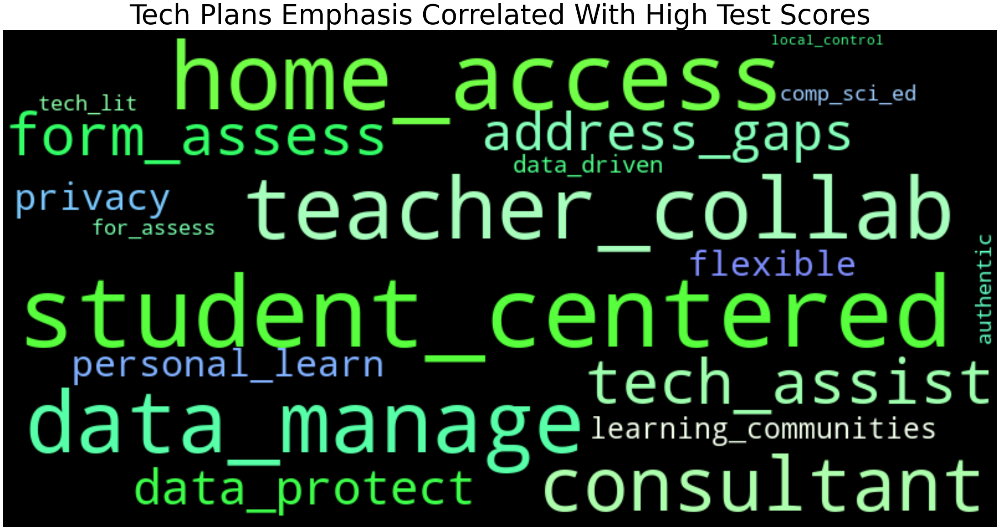

In [37]:
v.make_cloud_list(high_test, 'Tech Plans Emphasis Correlated With High Test Scores')

In [38]:
plans_test_neg = plans_test.loc[plans_test['test_ave'] < 0]
plans_test_neg

,test_ave
address_gaps,-0.141293
comp_sci_ed,-0.086892
data_driven,-0.191401
data_protect,-0.217621
digital_citizenfl,-0.053256
local_control,-0.267438
equity,-0.385425
for_assess,-0.361827
goals,-0.333553
home_access,-0.007866


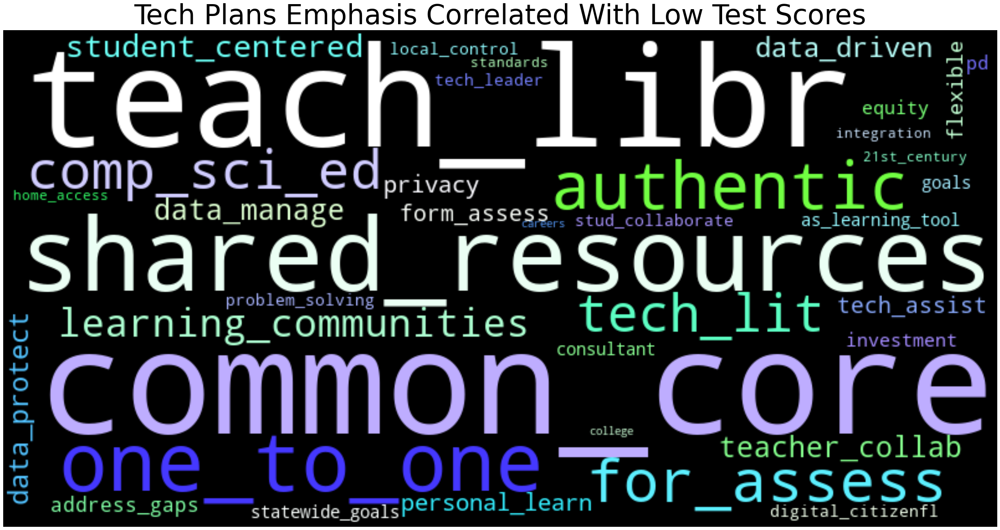

In [39]:
v.make_cloud_list(low_test, 'Tech Plans Emphasis Correlated With Low Test Scores')

Many technology-plan focuses positively correlated with increased student achievement are the same as those associated with increased usage of digital learning tools. Supporting teachers in using technology appears to be connected with increased use of technology and increased student achievement. Focusing on 21st-century skills is also positively correlated with both of these. However, as_learning_tool and address_gaps are not. On the other hand, authentic, student_centered, stud_collaborate, flexible, integration, problem_solving, standards, form_assess were not associated with increased technology use but with increased student achievement. Many of these aspects are often associated with best practices in teaching in general. In addition, a focus on using technology to prepare students for careers (college, careers) is also positively associated with student achievement.

### Work in Progress

This analysis is not yet complete. Below are the areas that I still plan to investigate. To see an example of what is planned for individual state analysis, you can look at the 'california' notebook. This notebook and the repository will be updated as new analysis is done.

### School Culture and Engagement

##### Answers the questions:

* Is there a correlation between school culture and online engagement?
* Is there a correlation between school culture and student achievement?
* Which factors related to school culture are associated with high or low online engagement?
* Which factors related to school culture are associated with high or low student achievement?

School culture was not a factor to be considered in the original questions generated for this study. However, it was decided to investigate this factor because it is something that school administrators have some control over. If there was a link between school culture and outcomes, the effort could be made to influence the factors that improve outcomes.

#### The answers to the following questions will be explored on an individual state basis
* Which programs had the most engagement in each state?

* Is there an increase or a decrease in online product activity during online learning?

* What is the correlation between each demographic factor and engagement with online platforms?

During exploratory analysis, these features varied greatly from state to state. Therefore, it was decided to investigate the answers with each state separately. Then an analysis will be conducted to examine similarities and differences between states.